<a href="https://colab.research.google.com/github/MartinOpa/2023-Z/blob/main/ZSU/ZSU_OPA0023.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import knihoven

In [26]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import math
import plotly.express as px
import sklearn
import sklearn.preprocessing, sklearn.cluster, sklearn.metrics
import scipy.spatial
import collections

from sklearn.cluster import Birch
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.neural_network import MLPClassifier, MLPRegressor
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, r2_score, mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression

import warnings
warnings.filterwarnings('ignore')

# Explorační analýza
# Inicializace dat
Dataset disponuje ojetými vozidly na polském trhu, konkrétně tyto informace:

*   Id: nepodstatné pro datovou analýzu, vypustíme
*   Značka: výrobce vozidla
*   Model: konkrétní model výrobce vozidla, nepodstatné pro datovou analýzu, vypustíme
*   Generace: označení generace modelu, nepodstatné pro datovou analýzu, vypustíme
*   Rok výroby: rok výroby vozidla, častěji však první zápis do registru vozidel
*   Nájezd: najetá vzdálenost v kilometrech
*   Objem motoru: zdvihový objem válců v cm$^3$
*   Palivo: informace o typu agregátu, který pohání vozidlo
*   Město: město, ve kterém je vozidlo inzerováno, nepodstatné pro datovou analýzu, vypustíme
*   Okres: okres, ve kterém je vozidlo inzerováno, nepodstatné pro datovou analýzu, vypustíme
*   Cena: cena inzerovaného vozidla v PLN






In [27]:
df = pd.read_csv("https://github.com/MartinOpa/2023-Z/raw/main/ZSU/Car_Prices_Poland_Kaggle.csv", sep=",")
df = df.loc[:, ["mark", "year", "mileage", "vol_engine", "fuel", "price"]]
df

,mark,year,mileage,vol_engine,fuel,price
0,opel,2015,139568,1248,Diesel,35900
1,opel,2018,31991,1499,Diesel,78501
2,opel,2015,278437,1598,Diesel,27000
3,opel,2016,47600,1248,Diesel,30800
4,opel,2014,103000,1400,CNG,35900
...,...,...,...,...,...,...
117922,volvo,2020,40000,1969,Hybrid,222790
117923,volvo,2017,51000,1969,Diesel,229900
117924,volvo,2016,83500,1969,Gasoline,135000
117925,volvo,2017,174000,1969,Diesel,154500


# Kontrola null hodnot

In [28]:
df.isna().sum()

mark          0
year          0
mileage       0
vol_engine    0
fuel          0
price         0
dtype: int64

V relevantních údajích se null hodnoty nevyskytují.

# Na začátek by bylo dobré seznámit se s numerickými hodnotami v datech

In [29]:
df.describe()

,year,mileage,vol_engine,price
count,117927.000000,1.179270e+05,117927.000000,1.179270e+05
mean,2012.925259,1.409768e+05,1812.057782,7.029988e+04
std,5.690135,9.236936e+04,643.613438,8.482458e+04
min,1945.000000,0.000000e+00,0.000000,5.000000e+02
25%,2009.000000,6.700000e+04,1461.000000,2.100000e+04
50%,2013.000000,1.462690e+05,1796.000000,4.190000e+04
75%,2018.000000,2.030000e+05,1995.000000,8.360000e+04
max,2022.000000,2.800000e+06,7600.000000,2.399900e+06


Jak je patrné, v Polsku se na stránce, ze které data pochází, v době sběru dat prodával veterán, který nám svým rokem výroby 1945 vytváří poměrně velkou odchylku od průměrného roku výroby 2012/2013.

U nájezdu je zvláštnost vozidlo s nulovým nájezdem, nicméně takovou hodnotu ignorovat nemůžeme. Na trhu vozidel se mohou vyskytovat také nová auta, průměrná hodnota je pak 140976.8 kilometrů a nejvýšší nájezd má vozidlo s 280000 kilometry.

Objem motoru má rovněž nulové záznamy, pravděpodobně způsobené vozidly s elektropohonem. Průměrný objem motoru je 1812 kubických centimetrů, což odpovídá nejčastějšímu objemu dieselových motorů v Evropě, avšak je mírně nižší, protože benzínové motory s objemem 1400 - 1600 kubických centimetrů jsou také velmi populární. Zajímavá maximální hodnota 7600ccm pak pravděpodobně pochází z auta určeného spíše pro severoamerický trh.

Na závěr velmi důležitý údaj - cena. Nejlevnější auto na trhu vychází na pouhých 500 zlotých, průměr na 70299.88 a nejdražší na 2399900 zlotých - po další analýze zjistíme, zda se také jedná o velmi unikátní hodnotu jako v případě auta s rokem výroby 1945.

# Distribuce vozidel podle druhu pohonu


In [30]:
px.histogram(df, x="fuel")

Na první pohled je patrné, že na trhu ojetin dominují auta s benzínovými a dieselovými agregáty. V malé míře se objevují vozidla na LPG, CNG, vozidla s hybridním pohonem a vozidla s elektromotory. Tyto hodnoty se dalo očekávat, hybridní a elektrický pohon stále není příliš rozšířený, zatímco CNG se používá primárně u vozidel MHD.

# Distribuce vozidel podle značky

In [31]:
px.histogram(df, x="mark")

Zde nás také nečeká žádné překvapení. V Evropě jsou na prvních čtyřech místech vozidla německé výroby (Audi, Opel, BMW a Volkswagen) a nedaleko za nimi je také americký Ford, který se však dnes vyrábí primárně v Německu. Poměrně velké zastoupení mají také francouzská auta - Renault, Citroen, Peugeot.

# Cena vozidel podle roku uvedení do provozu

In [32]:
px.box(df, x="year", y="price")

Distribuce cen napříč roky výroby má určitý trend - udává, že novější auta bývají dražší - avšak až okolo roku 1980. Auta staršího roku výroby již budou pravděpodobně vzácnější kusy.

Nicméně data v tomto grafu jsou velmi rozmanitá, bylo by vhodnější zohlednit také značku.


In [33]:
px.box(df, x="year", y="price", animation_frame="mark").update_yaxes(range=[0, 2500000])

Toto rozdělení grafů nám již poskytuje o něco lepší pochopení závislosti ceny na roku uvedení do provozu. U většiny značek můžeme pozorovat rostoucí cenu s rostoucím rokem uvedení do provozu, avšak u některých značek nacházíme ojedinělé případy velmi drahých vozů. Obzvláště překvapivá je Škoda za cenu 999999 zlotých a rokem výroby 2013, to ji staví na více než desetinásobek druhé nejdražší Škody tohoto ročníku. Nacházíme také několik velmi drahých vozů Mercedes-Benz, kde také nacházíme nejdražší vozidlo na inzerci.

# Průměrná cena vozidel podle značky

Nyní se podívejme na cenu vozidel podle značky, ale nezávisle na roku výroby.

<Axes: xlabel='mark'>

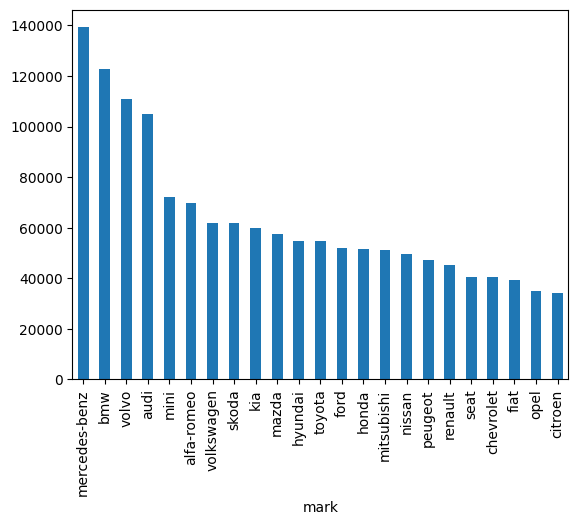

In [34]:
group = df.groupby("mark")["price"].mean()
group = group.sort_values(ascending=False)
group.plot(kind="bar")

Nejvyšší průměrná inzerovaná cena je za vozy značky Mercedes-Benz, BMW, Volvo a Audi. Na pátém místě je po větším propadu Mini, které patří pod značku BMW, tedy také nabízí svým zákazníkům určitý pocit prémiové značky.

# Cena vozidel podle druhu pohonu


In [35]:
px.box(df, x="fuel", y="price")

Na grafu zobrazující rozdělení cen podle paliva je patrné, že nejdražší auta jsou poháněna benzínovými agregáty, ostatní druhy pohonu jsou pak v rozmezí 0-1000000 zlotých, nejlevnější jsou vozidla na LPG a CNG, často nám však druh paliva v určení ceny nepomůže.

Na grafu si můžeme všimnout také dieselového agregátu s cenou 999999 zlotých, pravděpodobně se bude jednat o naši nejdražší Škodu.


#Průměrná cena vozidel podle druhu pohonu

<Axes: xlabel='fuel'>

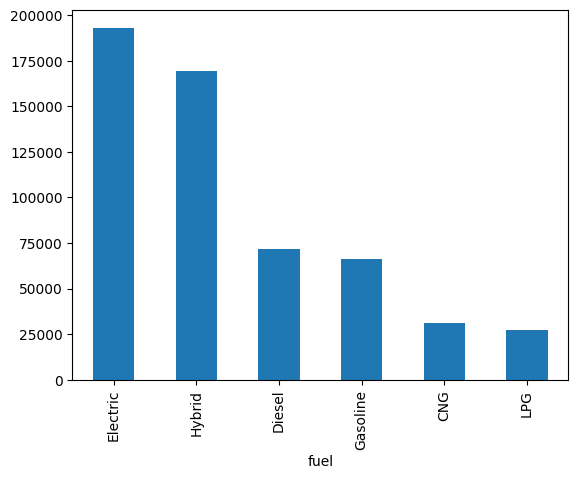

In [36]:
group = df.groupby("fuel")["price"].mean()
group = group.sort_values(ascending=False)
group.plot(kind="bar")

Oproti předešlému grafu nacházíme při pohledu na průměrné hodnoty, že nejdražší vozidla jsou ve skutečnosti na elektrický a hybridní pohon. Předešlý graf je pravděpodobně zkreslený tím, že spalovacích motorů je obecně mnohočetně více, to jsme již také pozorovali na grafu 'Distribuce vozidel podle druhu pohonu'. Tam jsme zjistili, že vozidel poháněných benzínovým motorem bylo inzerováno 61597, kdežto elektrických pouze 885.

# Cena vozidel podle objemu motoru

<Axes: xlabel='vol_engine', ylabel='price'>

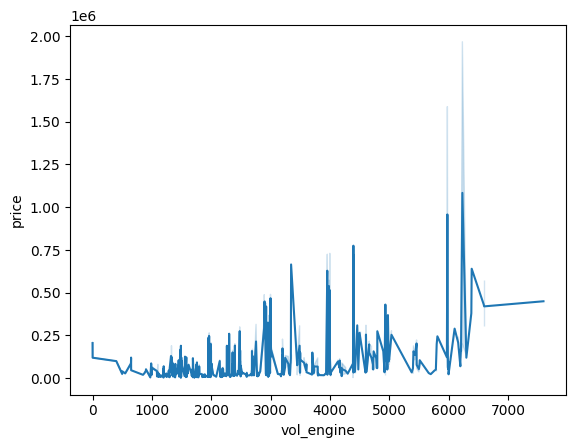

In [37]:
sns.lineplot(data=df, x="vol_engine", y="price")

Na tomto grafu můžeme pozorovat určitý trend vyšší ceny s vyšším objemem motoru, nicméně objem motoru sám o sobě není příliš dobrým ukazatelem ceny. Navíc již víme, že elektroauta a hybridy jsou poměrně drahá vozidla i přes jejich nulový či velmi nízký objem spalovacího motoru.

# Ověření hypotéz

<Axes: >

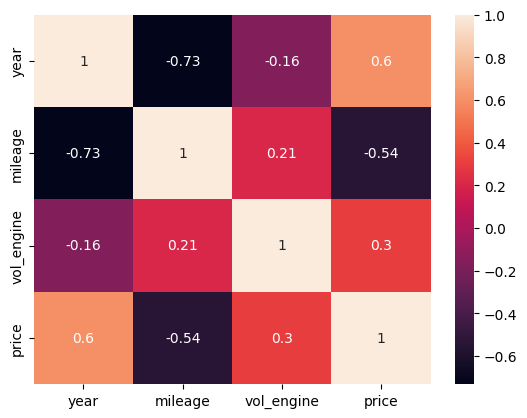

In [38]:
sns.heatmap(df.corr(), annot=True)

Z tohoto grafu je patrné, že cena závisí především na roku uvedení do provozu - z předchozích grafů víme, že nová auta jsou pro většinu populace atraktivnější. Popřít nemůžeme ani částečnou závislost ceny na objemu motoru, objemnější motory bývají dražší. Nízkou relevanci pro cenu má nájezd.

# Shluková analýza
# Typy jednotlivých sloupců datasetu

In [39]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 117927 entries, 0 to 117926
Data columns (total 6 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   mark        117927 non-null  object
 1   year        117927 non-null  int64 
 2   mileage     117927 non-null  int64 
 3   vol_engine  117927 non-null  int64 
 4   fuel        117927 non-null  object
 5   price       117927 non-null  int64 
dtypes: int64(4), object(2)
memory usage: 5.4+ MB


Typy jsou převážně kategorická data, která by bylo vhodné před další analýzou převést na číselné reprezentace.

Vytvoříme si kopii datasetu a provedeme převod.

In [40]:
df_clustering = df[["year", "mileage", "vol_engine", "fuel", "price"]].copy()
df_encoded = pd.DataFrame(index=df_clustering.index)
df_encoded = df_encoded.join(pd.get_dummies(df_clustering[["fuel"]]))
df_encoded

,fuel_CNG,fuel_Diesel,fuel_Electric,fuel_Gasoline,fuel_Hybrid,fuel_LPG
0,0,1,0,0,0,0
1,0,1,0,0,0,0
2,0,1,0,0,0,0
3,0,1,0,0,0,0
4,1,0,0,0,0,0
...,...,...,...,...,...,...
117922,0,0,0,0,1,0
117923,0,1,0,0,0,0
117924,0,0,0,1,0,0
117925,0,1,0,0,0,0


Dále by bylo vhodné data transformovat.

Pro cenu, nájezd a objem motoru použijeme StandardScaler, protože by měl být schopný dobře pracovat s odlehlými hodnotami.

Pro rok uvedení do provozu použijeme minmax scale, protože rozsah není velký.

In [41]:
df_encoded["year"] = sklearn.preprocessing.minmax_scale(df_clustering[["year"]])
df_encoded["mileage"] = sklearn.preprocessing.StandardScaler().fit_transform(df_clustering[["mileage"]])
df_encoded["vol_engine"] = sklearn.preprocessing.StandardScaler().fit_transform(df_clustering[["vol_engine"]])
df_encoded["price"] = sklearn.preprocessing.StandardScaler().fit_transform(df_clustering[["price"]])
df_encoded

,fuel_CNG,fuel_Diesel,fuel_Electric,fuel_Gasoline,fuel_Hybrid,fuel_LPG,year,mileage,vol_engine,price
0,0,1,0,0,0,0,0.909091,-0.015252,-0.876396,-0.405543
1,0,1,0,0,0,0,0.948052,-1.179896,-0.486409,0.096684
2,0,1,0,0,0,0,0.909091,1.488164,-0.332589,-0.510466
3,0,1,0,0,0,0,0.922078,-1.010911,-0.876396,-0.465668
4,1,0,0,0,0,0,0.896104,-0.411142,-0.640228,-0.405543
...,...,...,...,...,...,...,...,...,...,...
117922,0,0,0,0,1,0,0.974026,-1.093190,0.243846,1.797719
117923,0,1,0,0,0,0,0.935065,-0.974102,0.243846,1.881539
117924,0,0,0,1,0,0,0.922078,-0.622252,0.243846,0.762755
117925,0,1,0,0,0,0,0.935065,0.357514,0.243846,0.992642


# K-Means

Využijeme K-Means algoritmus.

In [43]:
X = df_encoded.values
clustering_scores = []
for k in range(2, 11):
    clustering = sklearn.cluster.KMeans(n_clusters=k, random_state=13).fit(X)
    clustering_scores.append({
        'k': k,
        'sse': clustering.inertia_,
        'silhouette': sklearn.metrics.silhouette_score(X, clustering.labels_)
    })
df_clustering_scores = pd.DataFrame.from_dict(clustering_scores, orient='columns')
df_clustering_scores = df_clustering_scores.set_index('k')

Nyní se podívejme na počet clusterů v grafech

<Axes: xlabel='k', ylabel='sse'>

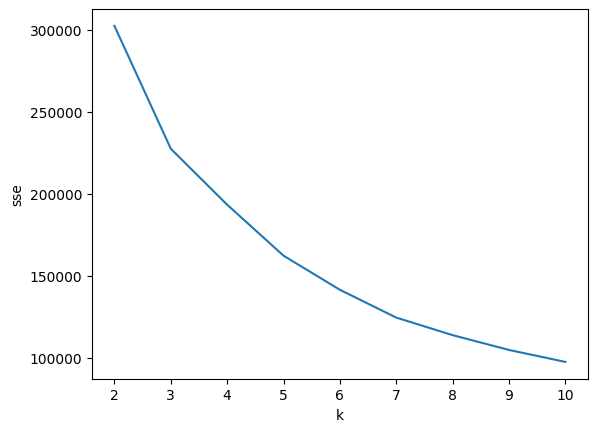

In [44]:
sns.lineplot(data = df_clustering_scores, y="sse", x="k")

<Axes: xlabel='k', ylabel='silhouette'>

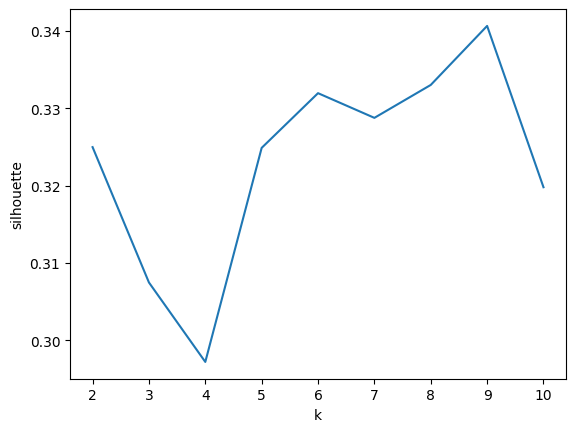

In [45]:
sns.lineplot(data = df_clustering_scores, y="silhouette", x="k")

Vhodnější vypadá první graf, který data rozděluje na 5 clusterů, můžeme se podívat na jejich rozdělení.

In [46]:
clustering = sklearn.cluster.KMeans(n_clusters=5, random_state=13).fit(X)
collections.Counter(clustering.labels_)
pd.Series(clustering.labels_).value_counts()

1    37904
2    34472
3    31640
0     6957
4     6954
dtype: int64

Data nejsou příliš rovnoměrně rozdělená, ale to by nás nemělo odradit od další analýzy, shluková analýza má spojit data, která spolu sdílí společné charakteristiky. Nyní si můžeme ID clusteru přidat do naší kopie datasetu a podívat se na jednotlivé shluky v grafech.

In [47]:
df_clustering["cluster_id"] = clustering.labels_
df_clustering

,year,mileage,vol_engine,fuel,price,cluster_id
0,2015,139568,1248,Diesel,35900,1
1,2018,31991,1499,Diesel,78501,3
2,2015,278437,1598,Diesel,27000,1
3,2016,47600,1248,Diesel,30800,3
4,2014,103000,1400,CNG,35900,2
...,...,...,...,...,...,...
117922,2020,40000,1969,Hybrid,222790,0
117923,2017,51000,1969,Diesel,229900,0
117924,2016,83500,1969,Gasoline,135000,3
117925,2017,174000,1969,Diesel,154500,1


# Rozdělení do jednotlivých shluků


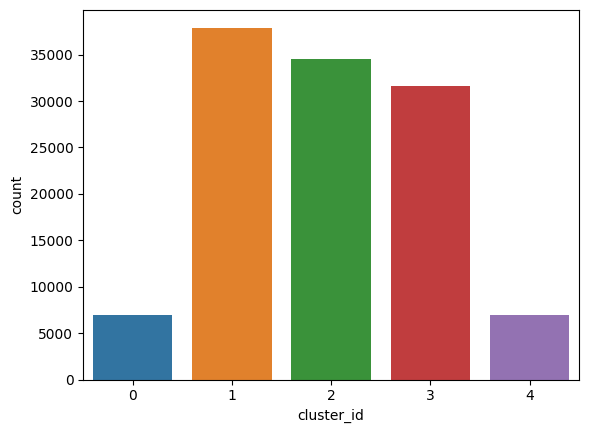

In [48]:
sns.countplot(data = df_clustering, x=df_clustering["cluster_id"] );

# Závislost ceny na objemu motoru

<Axes: xlabel='price', ylabel='vol_engine'>

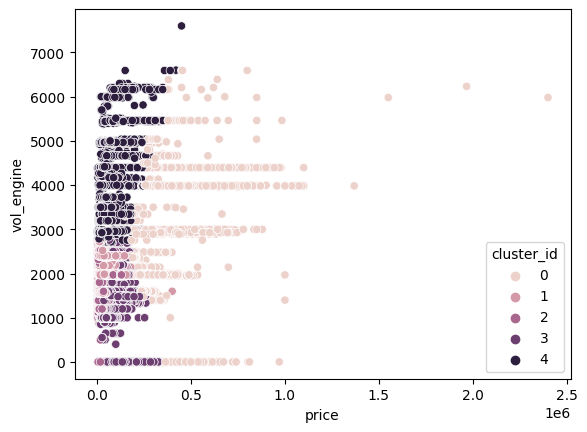

In [49]:
sns.scatterplot(data=df_clustering, x="price", y="vol_engine", hue="cluster_id")

V tomto grafu pozorujeme rozumně rozdělené shluky.

*   Cluster 0 bude pravděpodobně seskupení dražších aut nehledě na objem motoru.
*   Cluster 1 vypadá na levnější auta s objemem motoru mezi 2000 kubických centimetrů (chceme-li 2 litry) a 3 litry
*   Cluster 2 má velmi blízko clusteru 1, nicméně zahrnuje spíše motory s objemem menším než 2 litry.
*   Cluster 3 zahrnuje motory do objemu 2 litrů ve střední cenové relaci.
*   Cluster 4 obsahuje motory s objemem nad 3 litry a to v nižší a střední ceně.


# Závislost ceny na nájezdu motoru

<Axes: xlabel='price', ylabel='mileage'>

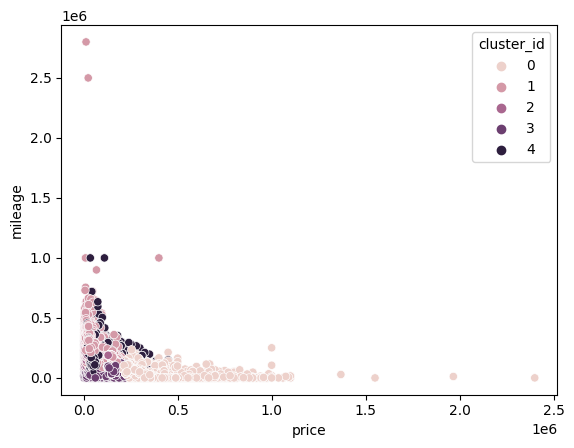

In [50]:
sns.scatterplot(data=df_clustering, x="price", y="mileage", hue="cluster_id")

V tomto případě pozorujeme u obou skupin poměrně odlehlé body, což nám dělá analýzu o něco složitější.

*   Cluster 0 znovu vyčleňuje dražší auta, v tomto případě s relativně nízkým nájezdem.
*   Cluster 1 většinou obsahuje vozidla s vyšším nájezdem a nižší cenou.
*   Cluster 2 víceméně splývá s clusterem 1, ale nájezd je častěji nižší než u clusteru 1, cena rovněž nižší.
*   Cluster 3 má relativně nízký nájezd a střední cenu, je zřetelně oddělen od výše zmíněných clusterů.
*   Cluster 4 se nám rozmístil takřka nezávisle na nájezdu, ale místy s vyšší cenou než clustery 1, 2 a 3.

<Axes: xlabel='price', ylabel='year'>

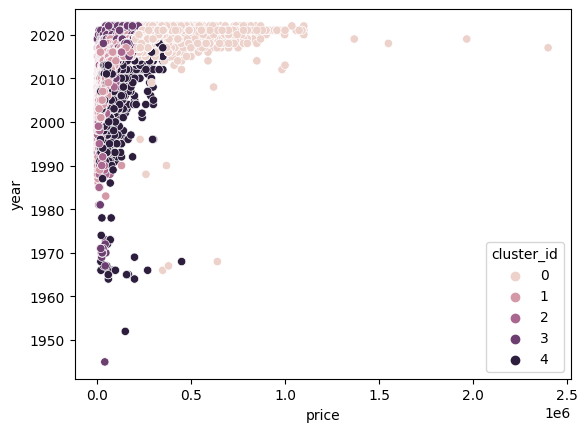

In [51]:
sns.scatterplot(data=df_clustering, x="price", y="year", hue="cluster_id")

Zde máme až na výjimečná auta starší než 1980 poměrně zřetelné shluky.

*   Cluster 0 se znovu vyznačuje svou cenou, nově můžeme vidět, že v něm jsou obsažena především nová auta, nicméně obsahuje i několik aut se starším rokem než 1970.
*   Cluster 1 obsahuje auta vyrobena přibližně mezi lety 2000 až 2020, přičemž s rostoucím rokem výroby roste také maximální cena.
*   Cluster 2 je v tomto případě trochu lépe oddělen od clusteru 1 než v ostatních grafech, které jsme zatím viděli. Obsahuje i starší vozidla než cluster 1 a rovněž s rostoucím rokem výroby roste také cena, avšak je dražší než vozidlo z clusteru 1 se stejným rokem výroby.
*   Cluster 3 obsahuje primárně novější auta s nižší až střední cenou.
*   Cluster 4 na roku výroby není příliš závislý, obsahuje vozidla nižší a střední cenové kategorie nehledě na rok výroby.

<Axes: xlabel='price', ylabel='fuel'>

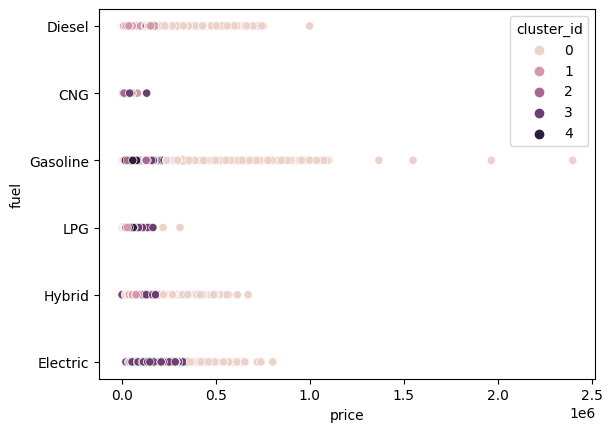

In [52]:
sns.scatterplot(data=df_clustering, x="price", y="fuel", hue="cluster_id")

Cluster 0 znovu vyčleňuje dražší auta, nehledě na palivo. Zbylé clustery jsou takřka nerozlišitelné mezi všemi druhy paliva, avšak cluster 1 pozorujeme převážně u dieselu, místy u LPG a hybridů. Cluster 2 náleží spíše benzínovým motorům.

Hypotéza tedy zní:
*   Cluster 0 polhtil takřka všechna drahá a nová auta.
*   Cluster 1 jsou levnější auta s vyšším nájezdem a nižší cenou, nejčastěji poháněné naftovými agregáty se středním objemem, ale i hybridním pohonem a na LPG.
*   Cluster 2 náleží levnějším benzínovým agregátům s nižším objemem než mají častěji naftové motory, tomu odpovídá také nižší nájezd oproti clusteru 1 - naftové motory jsou určeny spíše k delším trasám, LPG taktéž.
*   Cluster 3 obsahuje středně drahá auta s menším objemem motoru, a to na benzín, LPG, hybridní pohon (který často kombinuje elektrický pohon a malý benzínový agregát) a také zahrnuje elektroauta levnější než cluster 0.
*   Cluster 4 neobsahuje moc nových aut, za to mu náleží všechna auta s velkým objemem motoru, v drtivé většině se jedná o benzínový pohon nebo LPG, cenou odpovídá nižší a střední kategorii a má široké spektrum nájezdů.

Ve zkratce:
*   Cluster 0 = drahá nová auta
*   Cluster 1 = levná naftová, LPG a hybridní auta
*   Cluster 2 = levná benzínová auta
*   Cluster 3 = středně drahá benzínová, LPG, hybridní a elektrická auta
*   Cluster 4 = auta s objemnými motory na benzín nebo LPG

Pokud je hypotéza správná, auta by měla být rozdělena nejlépe na základě ceny a druhu pohonu. Cenu jsme jednoduše pozorovali v grafech, tedy měli bychom si spočítat výskyty druhů pohonu v jednotlivých clusterech.

In [53]:
(df_clustering[(df_clustering["fuel"] == "Gasoline") & (df_clustering["cluster_id"] == 0)].shape[0],
df_clustering[(df_clustering["fuel"] == "Diesel") & (df_clustering["cluster_id"] == 0)].shape[0],
df_clustering[(df_clustering["fuel"] == "LPG") & (df_clustering["cluster_id"] == 0)].shape[0],
df_clustering[(df_clustering["fuel"] == "CNG") & (df_clustering["cluster_id"] == 0)].shape[0],
df_clustering[(df_clustering["fuel"] == "Hybrid") & (df_clustering["cluster_id"] == 0)].shape[0],
df_clustering[(df_clustering["fuel"] == "Electric") & (df_clustering["cluster_id"] == 0)].shape[0])

(2344, 3798, 2, 0, 759, 54)

V clusteru 0 nacházíme všechny druhy pohonů drahých aut, tedy dává smysl, že CNG, které je montováno spíše do ekologických a úsporných vozidel zde nenajdeme. Rovněž nacházíme pouze 2 auta na LPG, které je také spíše volba úspory.

In [54]:
(df_clustering[(df_clustering["fuel"] == "Gasoline") & (df_clustering["cluster_id"] == 1)].shape[0],
df_clustering[(df_clustering["fuel"] == "Diesel") & (df_clustering["cluster_id"] == 1)].shape[0],
df_clustering[(df_clustering["fuel"] == "LPG") & (df_clustering["cluster_id"] == 1)].shape[0],
df_clustering[(df_clustering["fuel"] == "CNG") & (df_clustering["cluster_id"] == 1)].shape[0],
df_clustering[(df_clustering["fuel"] == "Hybrid") & (df_clustering["cluster_id"] == 1)].shape[0],
df_clustering[(df_clustering["fuel"] == "Electric") & (df_clustering["cluster_id"] == 1)].shape[0])

(85, 35771, 1834, 15, 199, 0)

Cluster 1 obsahuje většinu dieselových motorů, obsahuje také mnoho aut na LPG a pravděpodobně levnější hybridní vozidla.

In [55]:
(df_clustering[(df_clustering["fuel"] == "Gasoline") & (df_clustering["cluster_id"] == 2)].shape[0],
df_clustering[(df_clustering["fuel"] == "Diesel") & (df_clustering["cluster_id"] == 2)].shape[0],
df_clustering[(df_clustering["fuel"] == "LPG") & (df_clustering["cluster_id"] == 2)].shape[0],
df_clustering[(df_clustering["fuel"] == "CNG") & (df_clustering["cluster_id"] == 2)].shape[0],
df_clustering[(df_clustering["fuel"] == "Hybrid") & (df_clustering["cluster_id"] == 2)].shape[0],
df_clustering[(df_clustering["fuel"] == "Electric") & (df_clustering["cluster_id"] == 2)].shape[0])

(32887, 2, 1461, 26, 94, 2)

Cluster 2 obsahuje velkou část benzínových motorů, jak jsme usoudili z grafů.

In [56]:
(df_clustering[(df_clustering["fuel"] == "Gasoline") & (df_clustering["cluster_id"] == 3)].shape[0],
df_clustering[(df_clustering["fuel"] == "Diesel") & (df_clustering["cluster_id"] == 3)].shape[0],
df_clustering[(df_clustering["fuel"] == "LPG") & (df_clustering["cluster_id"] == 3)].shape[0],
df_clustering[(df_clustering["fuel"] == "CNG") & (df_clustering["cluster_id"] == 3)].shape[0],
df_clustering[(df_clustering["fuel"] == "Hybrid") & (df_clustering["cluster_id"] == 3)].shape[0],
df_clustering[(df_clustering["fuel"] == "Electric") & (df_clustering["cluster_id"] == 3)].shape[0])

(23244, 5474, 527, 6, 1560, 829)

Cluster 3 obsahuje auta ze všech druhů pohonů, podle grafů však zásadně levnější než cluster 0, ale dražší než clustery 1 a 2, nejčastější jsou benzínová, hybridní a elektrická auta.

In [57]:
(df_clustering[(df_clustering["fuel"] == "Gasoline") & (df_clustering["cluster_id"] == 4)].shape[0],
df_clustering[(df_clustering["fuel"] == "Diesel") & (df_clustering["cluster_id"] == 4)].shape[0],
df_clustering[(df_clustering["fuel"] == "LPG") & (df_clustering["cluster_id"] == 4)].shape[0],
df_clustering[(df_clustering["fuel"] == "CNG") & (df_clustering["cluster_id"] == 4)].shape[0],
df_clustering[(df_clustering["fuel"] == "Hybrid") & (df_clustering["cluster_id"] == 4)].shape[0],
df_clustering[(df_clustering["fuel"] == "Electric") & (df_clustering["cluster_id"] == 4)].shape[0])

(3037, 3431, 477, 0, 9, 0)

Zbylý cluster 4 obsahuje menší množství benzínových, dieselových a LPG vozidel, na evropském trhu moc vozidel s vysokým objemem motoru nemáme. Překvapivé však je, že obsahuje i 9 hybridních vozidel, nicméně i taková auta se vyrábí - některá hybridní vozidla mají motory s objemem i přes 3 a půl litru.

# Birch

Nyní vyzkoušíme metodu Birch.

In [58]:
df_birch = df[["year", "mileage", "vol_engine", "fuel", "price"]].copy()
df_birch["fuel"], unique_fuel =  pd.factorize(df["fuel"], sort=True)
df_birch = df_birch.infer_objects()

clustering = Birch(
    threshold = .25,
    branching_factor = 25,
    n_clusters = None
).fit(df_birch)

labels = clustering.predict(df_birch)
df_birch["cluster_id"] = labels
labels

array([46319,  8605, 96254, ..., 15533, 65464, 62260])

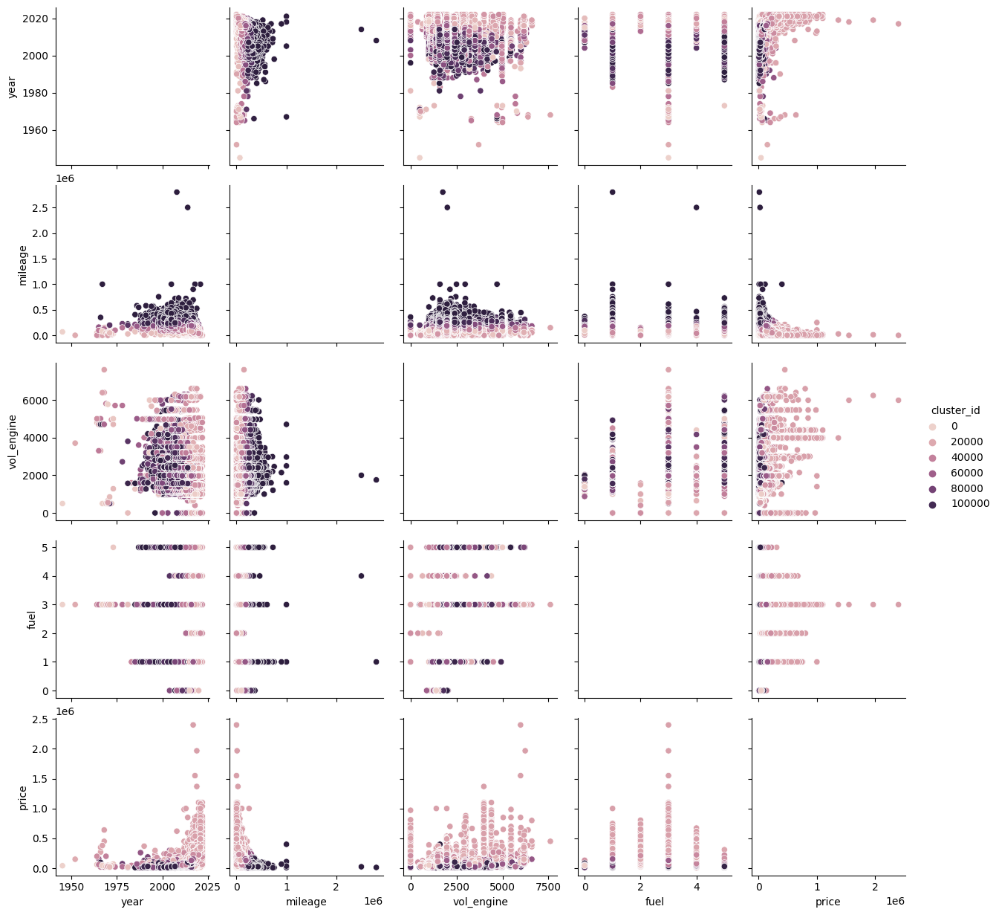

In [59]:
sns.color_palette("tab10")
sns.pairplot(df_birch, vars=["year", "mileage", "vol_engine", "fuel", "price"], hue="cluster_id")

Birch nám vytvořil 6 clusterů, které rozdělují data podobně jako K-Means, avšak bere větší ohled na nájezd, naopak na objem motoru a typ paliva převážně není brán zřetel. To jde vidět především u grafu závislosti mezi objemem motoru a nájezdem - shluky zde tvoří prakticky rovné linie, kdy cluster 6 obsahuje auta s nejvyšším nájezdem.
1.   Tento cluster nám u K-Means chybí - obsahuje spíše stará a levná auta s nižším nájezdem.
2.   Drahá auta bez ohledu na palivo a objem motoru, převážně nová - takže také převážně s malým nájezdem.
3.   Středně drahá auta s nízkým nájezdem.
4.   Středně drahá auta se středně vysokým nájezdem.
5.   Levná auta se středně vysokým nájezdem.
6.   Levná auta s vysokým nájezdem.

# Závěr clusterizace

Birch rozdělil jednotlivé shluky převážně podle nájezdu, ostatní kritéria hrají menší roli.

K-Means poskytl trochu komplexnější rozdělení, kdy zohlednil v jednotlivých skupinách kromě ceny také typ paliva a objem motoru.

# Klasifikační analýza

Na začátek si musíme data připravit - tedy vytvořit kopii původního datasetu, znovu převést kategorická data na numerická a následně rozdělit do trénovacího a testovacího subsetu. Na rozdíl od clusterizace ponecháme i sloupec výrobce vozidla.

Následně modely necháme "hádat" jakým typem pohonu vozidlo disponuje.

In [60]:
df_classification = df[["mark", "year", "mileage", "vol_engine", "fuel", "price"]].copy()
df_classification["mark"], unique_mark =  pd.factorize(df["mark"], sort=False)
df_classification["fuel"], unique_fuel =  pd.factorize(df["fuel"], sort=False)
df_classification = df_classification.infer_objects()
df_classification

,mark,year,mileage,vol_engine,fuel,price
0,0,2015,139568,1248,0,35900
1,0,2018,31991,1499,0,78501
2,0,2015,278437,1598,0,27000
3,0,2016,47600,1248,0,30800
4,0,2014,103000,1400,1,35900
...,...,...,...,...,...,...
117922,22,2020,40000,1969,4,222790
117923,22,2017,51000,1969,0,229900
117924,22,2016,83500,1969,2,135000
117925,22,2017,174000,1969,0,154500


In [61]:
X = df_classification.drop(columns=["fuel"]).values
ys = df_classification["fuel"].values
X.shape[0], ys.shape[0]

(117927, 117927)

In [62]:
X_train, X_test, ys_train, ys_test = train_test_split(X, ys, test_size=0.25, random_state=42)
X_train.shape[0], ys_train.shape[0], X_test.shape[0], ys_test.shape[0]

(88445, 88445, 29482, 29482)

# Vyzkoušíme modely KNeighbors, GaussianNB, DecisionTree, RandomForest a MultiLayerPerceptron

In [63]:
models = [
    ["KNN(3)", KNeighborsClassifier(3)],
    ["KNN(5)", KNeighborsClassifier(5)],
    ["KNN(7)", KNeighborsClassifier(7)],
    ["GaussianNB", GaussianNB()],
    ["DecisionTree", DecisionTreeClassifier()],
    ["RandomForest(10)", RandomForestClassifier(10)],
    ["RandomForest(20)", RandomForestClassifier(20)],
    ["RandomForest(50)", RandomForestClassifier(50)],
    ["RandomForest(100)", RandomForestClassifier(100)],
    ["MLP(10)", MLPClassifier(10)],
    ["MLP(20)", MLPClassifier(20)],
    ["MLP(50)", MLPClassifier(50)],
]

In [64]:
for name, model in models:
  model.fit(X_train, ys_train)
  trainp = model.score(X_train, ys_train)
  testp = model.score(X_test, ys_test)
  print(f"{name:20s} Train: {100*trainp:3.3f}%    Test: {100*testp:3.3f}%")

KNN(3)               Train: 80.245%    Test: 66.088%
KNN(5)               Train: 76.013%    Test: 67.322%
KNN(7)               Train: 74.150%    Test: 67.885%
GaussianNB           Train: 63.608%    Test: 63.700%
DecisionTree         Train: 99.964%    Test: 90.279%
RandomForest(10)     Train: 99.210%    Test: 92.226%
RandomForest(20)     Train: 99.688%    Test: 92.222%
RandomForest(50)     Train: 99.936%    Test: 92.534%
RandomForest(100)    Train: 99.963%    Test: 92.579%
MLP(10)              Train: 64.424%    Test: 64.555%
MLP(20)              Train: 65.741%    Test: 65.182%
MLP(50)              Train: 64.964%    Test: 64.511%


Nejlépe nám dopadl model RandomForest o 100 stromech s uspokojivým výsledkem 92.579%.

Nyní vyzkoušíme stejné modely využít na data škálovaná pomocí MinMax scaleru.

In [65]:
scaler = MinMaxScaler()
scaler.fit(X_train)

sX_train = scaler.transform(X_train)
sX_test = scaler.transform(X_test)

for name, model in models:
  model.fit(sX_train, ys_train)
  trainp = model.score(sX_train, ys_train)
  testp = model.score(sX_test, ys_test)
  print(f"{name:20s} Train: {100*trainp:3.3f}%    Test: {100*testp:3.3f}%")

KNN(3)               Train: 91.742%    Test: 85.615%
KNN(5)               Train: 89.410%    Test: 85.374%
KNN(7)               Train: 88.100%    Test: 84.998%
GaussianNB           Train: 63.159%    Test: 63.147%
DecisionTree         Train: 99.964%    Test: 90.163%
RandomForest(10)     Train: 99.231%    Test: 91.917%
RandomForest(20)     Train: 99.678%    Test: 92.334%
RandomForest(50)     Train: 99.933%    Test: 92.538%
RandomForest(100)    Train: 99.962%    Test: 92.589%
MLP(10)              Train: 74.303%    Test: 74.483%
MLP(20)              Train: 75.053%    Test: 75.585%
MLP(50)              Train: 75.282%    Test: 75.629%


Škálování dat výrazně pomohlo algoritmům KNeighbors (především v případě klasifikace podle tří sousedů) a všechny 3 hodnoty skrytých vrstev neuronové sítě.

Zvláštní je, že pokus RandomForest o 50 stromech se mírně zhoršil, to samé pozorujeme i u GaussianNB, nicméně je to pouze o 0.553%.

Nejlépe si se škálovanými daty poradil opět RandomForest se 100 stromy a výsledkem 92.589%, tedy jen mírně lepší výsledek než neškálovaný pokus se 100 stromy.

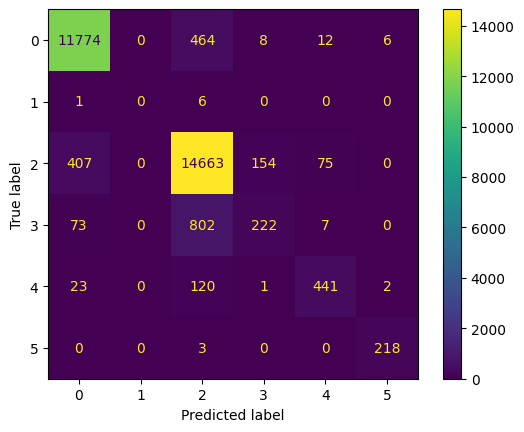

In [66]:
model = RandomForestClassifier(100)
model.fit(sX_train, ys_train)
predicted = model.predict(sX_test)

cm = confusion_matrix(ys_test, predicted, labels=model.classes_)
ConfusionMatrixDisplay(cm, display_labels=model.classes_).plot()

Confusion matrix má však jiný názor. Random forest byl sice poměrně úspěšný, ale v datech máme velmi málo aut na CNG (47).

Celkové počty pro připomenutí:

In [67]:
px.histogram(df, x="fuel")

Tedy algoritmus byl poměrně úspěšný, u elektroaut a částečně také hybridních vozů byl vzhledem k malému vzorku dat také použitelný, nicméně nedokázal poznat žádné vozidlo na CNG. LPG modelu také způsobilo problémy, nicméně zde bychom mohli udělat výjimku, protože v reálném světě prakticky neexistují auta čistě na LPG, tento druh paliva doprovází klasické benzínové agregáty přidáním nutných součástek a úpravou stávajících komponent motoru, stejným způsobem lze přidat i pohon na CNG, nicméně vozidla čistě na CNG ve světě existují a používají se především ve hromadné dopravě.

Pro ověření, zda si s CNG motory jiný model poradil lépe, se můžeme podívat na confusion matrix ostatních modelů.

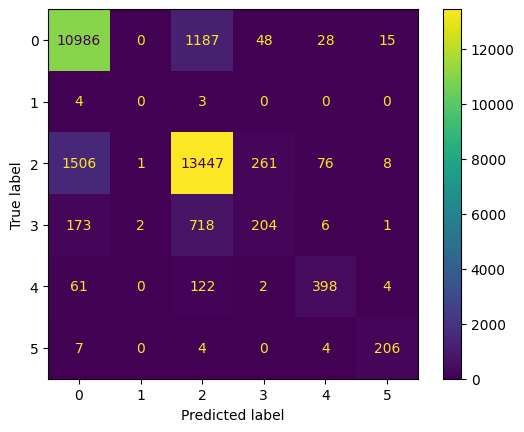

In [68]:
model = KNeighborsClassifier(3)
model.fit(sX_train, ys_train)
predicted = model.predict(sX_test)

cm = confusion_matrix(ys_test, predicted, labels=model.classes_)
ConfusionMatrixDisplay(cm, display_labels=model.classes_).plot()

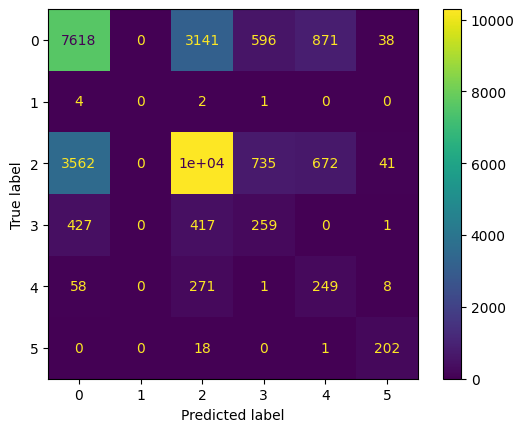

In [69]:
model = GaussianNB()
model.fit(sX_train, ys_train)
predicted = model.predict(sX_test)

cm = confusion_matrix(ys_test, predicted, labels=model.classes_)
ConfusionMatrixDisplay(cm, display_labels=model.classes_).plot()

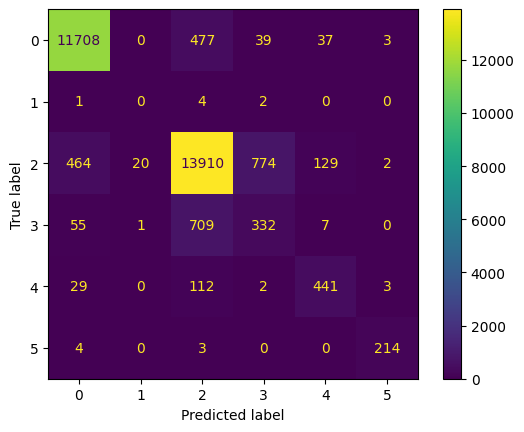

In [70]:
model = DecisionTreeClassifier()
model.fit(sX_train, ys_train)
predicted = model.predict(sX_test)

cm = confusion_matrix(ys_test, predicted, labels=model.classes_)
ConfusionMatrixDisplay(cm, display_labels=model.classes_).plot()

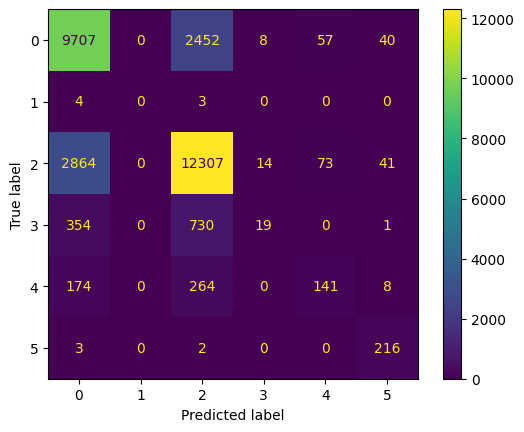

In [71]:
model = MLPClassifier(50)
model.fit(sX_train, ys_train)
predicted = model.predict(sX_test)

cm = confusion_matrix(ys_test, predicted, labels=model.classes_)
ConfusionMatrixDisplay(cm, display_labels=model.classes_).plot()

# Závěr klasifikace

Jak můžeme vidět, žádnémů modelu se nepodařilo identifikovat žádné vozidlo na CNG. Můžeme tedy bezpečně konstatovat, že nejlépe nám zafungoval random forest se 100 stromy a potíže s identifikací vozidel na CNG pravděpodobně spočívají v příliš malém vzorku dat.

# Regresní analýza

Na závěr práce se zaměříme na regresi. Znovu připravíme data a následně zkusíme předpovídat cenu vozidel na trhu.

In [83]:
df_regression = df[["mark", "year", "mileage", "vol_engine", "fuel", "price"]].copy()
df_regression["mark"], unique_mark =  pd.factorize(df["mark"], sort=True)
df_regression["fuel"], unique_fuel =  pd.factorize(df["fuel"], sort=True)
df_regression = df_regression.infer_objects()
df_regression

,mark,year,mileage,vol_engine,fuel,price
0,15,2015,139568,1248,1,35900
1,15,2018,31991,1499,1,78501
2,15,2015,278437,1598,1,27000
3,15,2016,47600,1248,1,30800
4,15,2014,103000,1400,0,35900
...,...,...,...,...,...,...
117922,22,2020,40000,1969,4,222790
117923,22,2017,51000,1969,1,229900
117924,22,2016,83500,1969,3,135000
117925,22,2017,174000,1969,1,154500


In [84]:
X = df_regression.drop(columns=["price"]).values
ys = df_regression["price"].values
X.shape[0], ys.shape[0]

(117927, 117927)

In [85]:
X_train, X_test, y_train, y_test = train_test_split(X, ys, test_size=0.25, random_state=42)
X_train.shape[0], y_train.shape[0], X_test.shape[0], y_test.shape[0]

(88445, 88445, 29482, 29482)

# Vyzkoušíme modely KNeighbors, LinearRegression, DecisionTree, RandomForest a MLP

In [86]:
models = [
    ["KNN(3)", KNeighborsRegressor(3)],
    ["KNN(5)", KNeighborsRegressor(5)],
    ["KNN(7)", KNeighborsRegressor(7)],
    ["LinearRegression", LinearRegression()],
    ["DecisionTree", DecisionTreeRegressor()],
    ["RandomForest(10)", RandomForestRegressor(10)],
    ["RandomForest(20)", RandomForestRegressor(20)],
    ["RandomForest(50)", RandomForestRegressor(50)],
    ["RandomForest(100)", RandomForestRegressor(100)],
    ["MLP(10)", MLPRegressor(10)],
    ["MLP(20)", MLPRegressor(20)],
    ["MLP(50)", MLPRegressor(50)],
    ["MLP(100)", MLPRegressor(100)],
    ["MLP(200)", MLPRegressor(200)],
]

In [90]:
print("                         Train                                       Test")
print("                         MAE          MSE        MAPE      SCORE     MAE        MSE           MAPE       SCORE")
for name, model in models:
  model.fit(X_train, y_train)
  train_predicted = model.predict(X_train)
  test_predicted = model.predict(X_test)
  mae_train = mean_absolute_error(y_train, train_predicted)
  mae_test = mean_absolute_error(y_test, test_predicted)
  mse_train = mean_squared_error(y_train, train_predicted)
  mse_test = mean_squared_error(y_test, test_predicted)
  mape_train = mean_absolute_percentage_error(y_train, train_predicted)
  mape_test = mean_absolute_percentage_error(y_test, test_predicted)
  score_train = r2_score(y_train, train_predicted)
  score_test = r2_score(y_test, test_predicted)
  print(f"{name:20s}  {mae_train:7.1f}    {mse_train:10.0f}  {100*mape_train:7.1f}%   {100*score_train:7.1f}%    {mae_test:7.1f}    {mse_test:10.0f}  {100*mape_test:7.1f}%   {100*score_test:7.1f}%")

                         Train                                       Test
                         MAE          MSE        MAPE      SCORE     MAE        MSE           MAPE       SCORE
KNN(3)                15650.9     900413301     33.7%      87.6%    22073.3    1559133789     50.1%      77.6%
KNN(5)                18102.4    1142769780     41.5%      84.3%    22096.7    1551177470     51.6%      77.7%
KNN(7)                19314.8    1256941235     45.4%      82.7%    22231.6    1532045957     52.6%      78.0%
LinearRegression      33198.3    3184575145     98.0%      56.2%    32979.4    2937840736     95.9%      57.8%
DecisionTree           2614.7     162847158      2.1%      97.8%    13899.4    1031655143     22.9%      85.2%
RandomForest(10)       6209.6     286142374      8.9%      96.1%    12377.7     704285659     20.1%      89.9%
RandomForest(20)       6063.7     249877924      8.6%      96.6%    12212.5     729016731     19.8%      89.5%
RandomForest(50)       5959.9     2414

Nejlépe nám dopadl random forest se 100 stromy s průměrnou chybou 19.6% a skóre 89.8%. Blízko mu jsou také ostatní pokusy random forest a také jednoduchý rozhodovací strom, ostatní modely nemají příliš uspokojivé výsledky.

Nyní vyzkoušíme stejné modely využít na data škálovaná pomocí MinMax scaleru.

In [91]:
scaler = MinMaxScaler()
scaler.fit(X_train)

sX_train = scaler.transform(X_train)
sX_test = scaler.transform(X_test)

In [92]:
print("                         Train                                       Test")
print("                         MAE          MSE        MAPE      SCORE     MAE        MSE           MAPE       SCORE")
for name, model in models:
  model.fit(sX_train, y_train)
  train_predicted = model.predict(sX_train)
  test_predicted = model.predict(sX_test)
  mae_train = mean_absolute_error(y_train, train_predicted)
  mae_test = mean_absolute_error(y_test, test_predicted)
  mse_train = mean_squared_error(y_train, train_predicted)
  mse_test = mean_squared_error(y_test, test_predicted)
  mape_train = mean_absolute_percentage_error(y_train, train_predicted)
  mape_test = mean_absolute_percentage_error(y_test, test_predicted)
  score_train = r2_score(y_train, train_predicted)
  score_test = r2_score(y_test, test_predicted)
  print(f"{name:20s}  {mae_train:7.1f}    {mse_train:10.0f}  {100*mape_train:7.1f}%   {100*score_train:7.1f}%    {mae_test:7.1f}    {mse_test:10.0f}  {100*mape_test:7.1f}%   {100*score_test:7.1f}%")

                         Train                                       Test
                         MAE          MSE        MAPE      SCORE     MAE        MSE           MAPE       SCORE
KNN(3)                 9297.9     460476406     14.6%      93.7%    12736.8     754980978     20.6%      89.2%
KNN(5)                10244.5     536530977     16.5%      92.6%    12302.9     704354794     20.0%      89.9%
KNN(7)                10741.5     587926399     17.4%      91.9%    12152.5     666194962     19.8%      90.4%
LinearRegression      33198.3    3184575145     98.0%      56.2%    32979.4    2937840736     95.9%      57.8%
DecisionTree           2614.7     162847158      2.1%      97.8%    13879.1     940900518     22.9%      86.5%
RandomForest(10)       6211.0     269134109      8.9%      96.3%    12404.7     738053893     20.1%      89.4%
RandomForest(20)       6063.3     252262157      8.7%      96.5%    12251.9     699195756     19.9%      90.0%
RandomForest(50)       5959.7     2432

Nejlépe nám opět dopadl random forest o 100 stromech s chybou 19.6% a skóre 89.9%. Můžeme pozorovat, že lineární regrese, rozhodovací strom a random forest takřka nereagují na škálování dat. V případě rozhodovacího stromu a modelu random forest je to zcela pochopitelné - fungují na základě porovnávání hodnot. Za povšimnutí také stojí razantní zhoršení výsledků v případě MLP.

Nyní vyzkoušíme stejné modely znovu použít na škálovaná data, avšak tentokrát budeme škálovat také cenu vozidel.

In [93]:
yscaler = MinMaxScaler()
yscaler.fit(y_train.reshape((y_train.shape[0], 1)))
sy_train = yscaler.transform(y_train.reshape((y_train.shape[0], 1))).ravel()
sy_test = yscaler.transform(y_test.reshape((y_test.shape[0], 1))).ravel()

In [94]:
print("                         Train                                       Test")
print("                         MAE          MSE        MAPE      SCORE     MAE        MSE           MAPE       SCORE")
for name, model in models:
  model.fit(sX_train, sy_train)
  train_predicted = model.predict(sX_train)
  test_predicted = model.predict(sX_test)
  train_predicted = yscaler.inverse_transform(train_predicted.reshape(train_predicted.shape[0], 1)).ravel()
  test_predicted = yscaler.inverse_transform(test_predicted.reshape(test_predicted.shape[0], 1)).ravel()
  mae_train = mean_absolute_error(y_train, train_predicted)
  mae_test = mean_absolute_error(y_test, test_predicted)
  mse_train = mean_squared_error(y_train, train_predicted)
  mse_test = mean_squared_error(y_test, test_predicted)
  mape_train = mean_absolute_percentage_error(y_train, train_predicted)
  mape_test = mean_absolute_percentage_error(y_test, test_predicted)
  score_train = r2_score(y_train, train_predicted)
  score_test = r2_score(y_test, test_predicted)
  print(f"{name:20s}  {mae_train:7.1f}    {mse_train:10.0f}  {100*mape_train:7.1f}%   {100*score_train:7.1f}%    {mae_test:7.1f}    {mse_test:10.0f}  {100*mape_test:7.1f}%   {100*score_test:7.1f}%")

                         Train                                       Test
                         MAE          MSE        MAPE      SCORE     MAE        MSE           MAPE       SCORE
KNN(3)                 9297.9     460476406     14.6%      93.7%    12736.8     754980978     20.6%      89.2%
KNN(5)                10244.5     536530977     16.5%      92.6%    12302.9     704354794     20.0%      89.9%
KNN(7)                10741.5     587926399     17.4%      91.9%    12152.5     666194962     19.8%      90.4%
LinearRegression      33198.3    3184575145     98.0%      56.2%    32979.4    2937840736     95.9%      57.8%
DecisionTree           2614.7     162847158      2.1%      97.8%    13861.2     934257861     22.8%      86.6%
RandomForest(10)       6165.6     261170223      8.9%      96.4%    12463.5     758394685     20.1%      89.1%
RandomForest(20)       6077.3     255133310      8.7%      96.5%    12267.4     726354843     19.9%      89.6%
RandomForest(50)       5965.7     2391

Znovu vede random forest o 100 stromech, který si zachovává své předešlé hodnoty. Můžeme pozorovat zlepšení průměrné chyby v případě MLP, avšak model stále neposkytuje lepší výsledky než daleko rychlejší random forest.

# Závěr práce

V explorační analýze jsme se seznámili s datasetem vozidel z polské inzerce. Trh plně odpovídá evropským standardům - oblíbená jsou vozidla evropských značek, převážně na spalovací a zážehové motory. Elektroauta zatím nejsou příliš rozšířená a průměrná cena je až trojnásobek průměrné ceny vozidel se spalovacími motory. Cena závisí hlavně na roku výroby a na značce, kdy nejdražší vozidla jsou značky Mercedes-Benz.

Ve shlukové analýze jsme vyzkoušeli metody K-Means a Birch. K-Means algoritmus nám poskytl o něco přehlednější rozdělení, které zohledňovalo především rok výroby (a tím částečně nájezd) a cenu u jednoho clusteru, u ostatních clusterů však také objem motoru a druh pohonu, zde shluky tvořily logické celky podle pořizovací ceny, rok výroby (z toho částečně odvoditelný stav vozidla) a provozních nákladů (tedy účel užití vozidla). Birch své shluky zakládal především na nájezdu vozidla, u ostatních kritérií tolik informací neposkytl.

V klasifikační analýze jsme vyzkoušeli modely KNeighbors, GaussianNB, DecisionTree, RandomForest a dnes velmi oblíbenou neuronovou síť - MultiLayerPerceptron. Nejúspěšnější byl model RandomForest se 100 stromy, nicméně žádnému modelu se nepodařilo identifikovat vozidla poháněná CNG.

Na závěr jsme si v regresní analýze vyzkoušeli modely KNeighbors, GaussianNB, LinearRegression, DecisionTree, RandomForest a MLP. Nejlépe nám v predikci ceny zafungovaly modely DecisionTree a RandomForest, tedy dva velmi podobné přístupy, které rozhodují na základě porovnávání hodnot ve stromové struktuře. Nejzajímavější výsledek poskytl MLP o 10 vnitřních vrstvách, kdy jsem po jednom z běhů modelu nad škálovanými daty, ale neškálovanou cenou, dostal záporné skóre.

# Názor na dataset

Vybraný dataset se mi velmi líbil, zajímám se o auta a mohl jsem se seznámit s podrobnějšími zajímavostmi z nedalekého trhu vozidel, nicméně obsahoval jisté zajímavosti - nástrahy, které komplikovaly samotné úlohy - velmi malý podíl vozidel na CNG (což není překvapivé, ale tento fakt zapříčinil horší výsledky v klasifikační analýze), naftová Škoda za 1 milion PLN, Mercedes-Benz za 2 a půl milionu PLN nebo auto s nájezdem úctyhodných 2.8 milionů kilometrů - tedy skoro 70 cest po obvodu Země. Shluková analýza by pravděpodobně byla jednodušší, kdybych tyto odlehlé záznamy vypustil, nicméně jsou to (pravděpodobně) reálná data se kterými je potřeba počítat.